In [1]:
from catboost import CatBoostClassifier
from itertools import chain
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud

import datetime
import gc
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go
import seaborn as sns
import time
import warnings

%matplotlib inline
np.random.seed(2018)
stop = set(stopwords.words('english'))
py.init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')

In [66]:
# turn off analytics for training, or running out of memory.
ANALYTICS = True

### Load Data

In [94]:
market_train_df = pd.read_csv('../data/marketdata.csv', parse_dates= ['time'])
news_train_df = pd.read_csv('../data/newsdata.csv', parse_dates= ['time'])

### Market Data

The data includes a subset of US-listed instruments. The set of included instruments changes daily and is determined based on the amount traded and the availability of information. This means that there may be instruments that enter and leave this subset of data. There may therefore be gaps in the data provided, and this does not necessarily imply that that data does not exist (those rows are likely not included due to the selection criteria).

The marketdata contains a variety of returns calculated over different timespans. All of the returns in this set of marketdata have these properties:

Returns are always calculated either open-to-open (from the opening time of one trading day to the open of another) or close-to-close (from the closing time of one trading day to the open of another).
Returns are either raw, meaning that the data is not adjusted against any benchmark, or market-residualized (Mktres), meaning that the movement of the market as a whole has been accounted for, leaving only movements inherent to the instrument.
Returns can be calculated over any arbitrary interval. Provided here are 1 day and 10 day horizons.
Returns are tagged with 'Prev' if they are backwards looking in time, or 'Next' if forwards looking.

In [95]:
print(market_train_df.shape)

(4072956, 17)


In [96]:
market_train_df.head()

,Unnamed: 0,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
0,0,2007-02-01 22:00:00,A.N,Agilent Technologies Inc,2606900.0,32.19,32.17,0.005938,0.005312,NaN,NaN,-0.001860,0.000622,NaN,NaN,0.034672,1.0
1,1,2007-02-01 22:00:00,AAI.N,AirTran Holdings Inc,2051600.0,11.12,11.08,0.004517,-0.007168,NaN,NaN,-0.078708,-0.088066,NaN,NaN,0.027803,0.0
2,2,2007-02-01 22:00:00,AAP.N,Advance Auto Parts Inc,1164800.0,37.51,37.99,-0.011594,0.025648,NaN,NaN,0.014332,0.045405,NaN,NaN,0.024433,1.0
3,3,2007-02-01 22:00:00,AAPL.O,Apple Inc,23747329.0,84.74,86.23,-0.011548,0.016324,NaN,NaN,-0.048613,-0.037182,NaN,NaN,-0.007425,1.0
4,4,2007-02-01 22:00:00,ABB.N,ABB Ltd,1208600.0,18.02,18.01,0.011791,0.025043,NaN,NaN,0.012929,0.020397,NaN,NaN,-0.017994,1.0


In [97]:
market_train_df.describe()

,Unnamed: 0,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
count,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.056976e+06,4.056968e+06,4.072956e+06,4.072956e+06,3.979946e+06,3.979902e+06,4.072956e+06,4.072956e+06
mean,2.036478e+06,2.665312e+06,3.971241e+01,3.971233e+01,5.473026e-04,9.569113e-03,1.738580e-04,9.309293e-03,5.232021e-03,1.423685e-02,1.638857e-03,1.481702e-02,1.405528e-02,5.949365e-01
std,1.175761e+06,7.687606e+06,4.228822e+01,4.261116e+01,3.697774e-02,7.084388e+00,3.270305e-02,6.968866e+00,8.872484e-02,7.123552e+00,7.517820e-02,7.285742e+00,7.242467e+00,4.909044e-01
min,0.000000e+00,0.000000e+00,7.000000e-02,1.000000e-02,-9.776464e-01,-9.998881e-01,-1.235622e+00,-6.158463e+02,-9.774034e-01,-9.998904e-01,-3.343277e+00,-1.375045e+03,-1.375045e+03,0.000000e+00
25%,1.018239e+06,4.657968e+05,1.725000e+01,1.725000e+01,-1.089241e-02,-1.108987e-02,-8.569246e-03,-1.002114e-02,-3.339148e-02,-3.337574e-02,-2.927584e-02,-2.962645e-02,-2.970509e-02,0.000000e+00
50%,2.036478e+06,9.821000e+05,3.030000e+01,3.029000e+01,3.373819e-04,3.824092e-04,-1.236127e-04,-3.356938e-06,5.160339e-03,5.165128e-03,8.329261e-04,1.126206e-03,1.044642e-03,1.000000e+00
75%,3.054716e+06,2.403165e+06,4.986000e+01,4.985000e+01,1.165695e-02,1.183612e-02,8.397528e-03,1.002712e-02,4.297606e-02,4.298507e-02,3.059022e-02,3.171535e-02,3.152750e-02,1.000000e+00
max,4.072955e+06,1.226791e+09,1.578130e+03,9.998990e+03,4.559245e+01,9.209000e+03,4.512244e+01,8.989207e+03,4.667181e+01,9.382000e+03,4.624971e+01,9.761338e+03,9.761338e+03,1.000000e+00


From the price history of 5 randomly picked assets below, we learn that securities could have dramatically different lengths of history in this data set. Learning from securities with longer history is probably more meaningful.

In [98]:
if ANALYTICS:
    data = []
    for asset in np.random.choice(market_train_df['assetName'].unique(), 5):
        df = market_train_df[(market_train_df['assetName'] == asset)]

        data.append(go.Scatter(
            x = df['time'].dt.strftime(date_format='%Y-%m-%d').values,
            y = df['close'].values,
            name = asset
        ))
    layout = go.Layout(dict(title = "Price History of 5 Randomly Picked Assets",
                      yaxis = dict(title = 'Price (USD)'),
                      ),legend=dict(orientation="h"))
    py.iplot(dict(data=data, layout=layout), filename='basic-line')

How does the universe look? Do we see the impact of major news on the market?

In [99]:
if ANALYTICS:
    data = []
    for i in [0.1, 0.25, 0.5, 0.75, 0.9]:
        df = market_train_df.groupby('time')['close'].quantile(i).reset_index()

        data.append(go.Scatter(
            x = df['time'].dt.strftime(date_format='%Y-%m-%d').values,
            y = df['close'].values,
            name = f'{i} quantile'
        ))
    layout = go.Layout(dict(title = "Closing Prices in Quantiles",
                      yaxis = dict(title = 'Price (USD)'),
                      ), legend=dict(orientation="h"),
        annotations=[
            dict(
                x='2007-02-01 00:00:00+0000',
                y=75,
                xref='x',
                yref='y',
                text='<b>Housing crisis</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-30,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            ),
            dict(
                x='2008-09-01 22:00:00+0000',
                y=70,
                xref='x',
                yref='y',
                text='<b>Collapse of Lehman Brothers</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-70,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            ),
            dict(
                x='2011-08-01 22:00:00+0000',
                y=75,
                xref='x',
                yref='y',
                text='<b>Black Monday</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-100,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            ),
            dict(
                x='2015-06-01 00:00:00+0000',
                y=100,
                xref='x',
                yref='y',
                text='<b>Stock market selloff</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-60,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            ),
            dict(
                x='2015-09-01 00:00:00+0000',
                y=100,
                xref='x',
                yref='y',
                text='<b>Oil prices crash</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-100,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            ),
            dict(
                x='2016-06-23 00:00:00+0000',
                y=100,
                xref='x',
                yref='y',
                text='<b>Brexit</b>',
                showarrow=True,
                font=dict(
                    size=12,
                    color='#ffffff'
                ),
                align='center',
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor='#636363',
                ax=0,
                ay=-30,
                borderpad=4,
                bgcolor='#0093D1',
                opacity=0.8
            )
        ])
    py.iplot(dict(data=data, layout=layout), filename='basic-line')

We see that some events only left a small dent on stock prices, while others had more profound impact on the market. 

### Data Integrity Check

In [129]:
market_train_df['price_diff'] = market_train_df['close'] - market_train_df['open']

In [130]:
if ANALYTICS:
    grouped = market_train_df.groupby('time').agg({'price_diff': ['std', 'min', 'max']}).reset_index()
    grouped['price_diff'].describe()

In [131]:
if ANALYTICS:
    g = grouped.sort_values(('price_diff', 'std'), ascending=False)[:10]
    g['min_text'] = 'Maximum price drop: ' + (g['price_diff']['min']).astype(str)
    trace = go.Scatter(
        x = g['time'].dt.strftime(date_format='%Y-%m-%d').values,
        y = g['price_diff']['std'].values,
        mode='markers',
        marker=dict(
            size = g['price_diff']['std'].values,
            color = g['price_diff']['std'].values,
            colorscale='Portland',
            showscale=True
        ),
        text = g['min_text'].values
    )
    data = [trace]

    layout= go.Layout(
        autosize= True,
        title= 'Top 10 Outliers of 1-Day Price Change by Month',
        hovermode= 'closest',
        yaxis=dict(
            title= 'std',
            ticklen= 5,
            gridwidth= 2,
        ),
        showlegend= False
    )
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig,filename='top10_std_chg')

There's no way that the price of a stock can drop by $9948.99 in a day. The others also look suspicious. Let's first find out what securities they are and then verify them through other source. 

In [132]:
market_train_df.sort_values('price_diff')[:10]

,Unnamed: 0,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe,close_to_open,price_diff
1127598,1127598,2010-01-04 22:00:00,TW.N,Towers Watson & Co,223136.0,78.538297,9998.9900,-0.058470,0.100000,-0.056911,0.100000,-0.024316,0.200000,0.034162,0.200000,0.200000,0.0,0.005001,-9920.451703
627547,627547,2008-09-29 22:00:00,BK.N,Bank of New York Mellon Corp,18718479.0,34.401717,3288.1136,-0.100000,0.100000,-0.064067,0.100000,-0.200000,0.200000,-0.189620,0.200000,0.200000,1.0,0.008059,-3253.711883
502997,502997,2008-06-05 22:00:00,AHG.N,Apria Healthcare Group Inc,801892.0,26.098287,999.9900,0.009930,0.100000,-0.001831,0.100000,0.104792,0.200000,0.140881,0.200000,-0.200000,0.0,0.017290,-973.891713
242847,242847,2007-09-27 22:00:00,EXH.N,Archrock Inc,490100.0,29.846959,999.9900,0.022236,0.100000,0.018789,0.100000,0.007304,0.200000,0.012866,0.200000,-0.200000,1.0,0.079991,-970.143041
471381,471381,2008-05-06 22:00:00,CEPH.O,Cephalon Inc,4846.0,68.956367,999.9900,0.014628,0.100000,0.009554,0.100000,-0.039950,0.200000,-0.053743,0.200000,0.087719,1.0,0.061041,-931.033633
3264631,3264631,2015-03-16 22:00:00,TECD.O,Tech Data Corp,674385.0,48.685718,263.8000,0.036447,0.100000,0.020318,0.100000,-0.066172,0.200000,-0.021922,0.200000,0.072616,0.0,0.214519,-215.114282
7273,7273,2007-02-08 22:00:00,BA.N,Boeing Co,5155700.0,92.403041,200.0000,-0.009186,0.100000,-0.006835,0.100000,0.043010,0.200000,NaN,NaN,0.004434,1.0,0.447600,-107.596959
375899,375899,2008-02-06 22:00:00,CME.N,CME Group Inc,8676040.0,485.250000,583.4900,-0.100000,-0.061536,-0.100000,-0.023137,-0.200000,0.025448,-0.188712,-0.021896,-0.006932,1.0,0.831634,-98.240000
628075,628075,2008-09-29 22:00:00,IBM.N,International Business Machines Corp,9586679.0,114.460000,191.9800,-0.041534,0.100000,0.018300,0.100000,-0.006337,0.200000,0.010630,0.200000,0.013094,1.0,0.596208,-77.520000
3565205,3565205,2015-11-20 22:00:00,CMG.N,Chipotle Mexican Grill Inc,5023617.0,536.190000,612.0000,-0.100000,0.027863,-0.100000,0.028139,-0.124445,0.004926,NaN,NaN,-0.001849,0.0,0.876127,-75.810000


Put a ceiling and floor on these outliers with mean open or close price. 

In [133]:
market_train_df['close_to_open'] =  np.abs(market_train_df['close'] / market_train_df['open'])

In [134]:
if ANALYTICS:
    print(f"Number of securities whose prices doubled in one day: {(market_train_df['close_to_open'] >= 2).sum()}.")
    print(f"Number of securities whose prices fell by more then 50%: {(market_train_df['close_to_open'] <= 0.5).sum()}.")

Number of securities whose prices doubled in one day: 35.
Number of securities whose prices fell by more then 50%: 16.


In [135]:
market_train_df['assetName_mean_open'] = market_train_df.groupby('assetName')['open'].transform('mean')
market_train_df['assetName_mean_close'] = market_train_df.groupby('assetName')['close'].transform('mean')

# if open price is too far from mean open price for this company, replace it. Otherwise replace close price.
for i, row in market_train_df.loc[market_train_df['close_to_open'] >= 2].iterrows():
    if np.abs(row['assetName_mean_open'] - row['open']) > np.abs(row['assetName_mean_close'] - row['close']):
        market_train_df.iloc[i,6] = row['assetName_mean_open']
    else:
        market_train_df.iloc[i,5] = row['assetName_mean_close']
        
for i, row in market_train_df.loc[market_train_df['close_to_open'] <= 0.5].iterrows():
    if np.abs(row['assetName_mean_open'] - row['open']) > np.abs(row['assetName_mean_close'] - row['close']):
        market_train_df.iloc[i,6] = row['assetName_mean_open']
    else:
        market_train_df.iloc[i,5] = row['assetName_mean_close']

Now let's try to rebuild the graph and make sure all the outliers are taken care.

In [136]:
if ANALYTICS:
    market_train_df['price_diff'] = market_train_df['close'] - market_train_df['open']
    grouped = market_train_df.groupby(['time']).agg({'price_diff': ['std', 'min']}).reset_index()
    g = grouped.sort_values(('price_diff', 'std'), ascending=False)[:10]
    g['min_text'] = 'Maximum price drop: ' + (-1 * np.round(g['price_diff']['min'], 2)).astype(str)
    trace = go.Scatter(
        x = g['time'].dt.strftime(date_format='%Y-%m-%d').values,
        y = g['price_diff']['std'].values,
        mode='markers',
        marker=dict(
            size = g['price_diff']['std'].values * 5,
            color = g['price_diff']['std'].values,
            colorscale='Portland',
            showscale=True
        ),
        text = g['min_text'].values
    )
    data = [trace]

    layout= go.Layout(
        autosize= True,
        title= 'Top 10 Outliers of 1-Day Price Change by Month',
        hovermode= 'closest',
        yaxis=dict(
            title= 'Std',
            ticklen= 5,
            gridwidth= 2,
        ),
        showlegend= False
    )
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig,filename='scatter2010')

In [108]:
market_train_df.drop(['price_diff', 'assetName_mean_open', 'assetName_mean_close'], axis=1, inplace=True)

Now let's take a look at the target variable.

In [109]:
if ANALYTICS:
    data = []
    for i in [0.1, 0.25, 0.5, 0.75, 0.9]:
        df = market_train_df.groupby('time')['returnsOpenNextMktres10'].quantile(i).reset_index()

        data.append(go.Scatter(
            x = df['time'].dt.strftime(date_format='%Y-%m-%d').values,
            y = df['returnsOpenNextMktres10'].values,
            name = f'{i} quantile'
        ))
    layout = go.Layout(dict(title = "returnsOpenNextMktres10 by Quantiles",
                      yaxis = dict(title = 'Daily Return'),
                      ), legend=dict(orientation="h"))
    py.iplot(dict(data=data, layout=layout), filename='basic-line')

We see a wide dispersion of 10-day forward-looking market residual returns during major market events. Other times, the returns fluctuate around long-term mean.

In [110]:
if ANALYTICS:
    data = []
    for col in ['returnsOpenNextMktres10',
            'returnsClosePrevRaw1', 'returnsOpenPrevRaw1',
           'returnsClosePrevMktres1', 'returnsOpenPrevMktres1',
           'returnsClosePrevRaw10', 'returnsOpenPrevRaw10',
           'returnsClosePrevMktres10', 'returnsOpenPrevMktres10']:
        df = market_train_df.groupby('time')[col].mean().reset_index()
        data.append(go.Scatter(
            x = df['time'].dt.strftime(date_format='%Y-%m-%d').values,
            y = df[col].values,
            name = col
        ))

    layout = go.Layout(dict(title = "Average Returns Through Time (Before)",
                      yaxis = dict(title = 'Daily Return'), 
                      legend=dict(orientation="h")))
    py.iplot(dict(data=data, layout=layout), filename='basic-line')

I see a lot of people throw away data prior to 2009 because the returns were quite extreme during the financial crisis. I'm not sure whether that's the best thing to do. In my opinion, a better way to mitigate the impact of extreme data points around 2008 is to clip the data with a reasonable range.

In [111]:
market_train_df['returnsOpenNextMktres10'] = market_train_df['returnsOpenNextMktres10'].clip(-0.2, 0.2)
market_train_df['returnsClosePrevRaw1'] = market_train_df['returnsClosePrevRaw1'].clip(-0.1, 0.1)
market_train_df['returnsOpenPrevRaw1'] = market_train_df['returnsOpenPrevRaw1'].clip(-0.1, 0.1)
market_train_df['returnsClosePrevMktres1'] = market_train_df['returnsClosePrevMktres1'].clip(-0.1, 0.1)
market_train_df['returnsOpenPrevMktres1'] = market_train_df['returnsOpenPrevMktres1'].clip(-0.1, 0.1)
market_train_df['returnsClosePrevRaw10'] = market_train_df['returnsClosePrevRaw10'].clip(-0.2, 0.2)
market_train_df['returnsOpenPrevRaw10'] = market_train_df['returnsOpenPrevRaw10'].clip(-0.2, 0.2)
market_train_df['returnsClosePrevMktres10'] = market_train_df['returnsClosePrevMktres10'].clip(-0.2, 0.2)
market_train_df['returnsOpenPrevMktres10'] = market_train_df['returnsOpenPrevMktres10'].clip(-0.2, 0.2)

In [112]:
if ANALYTICS:
    data = []
    for col in ['returnsOpenNextMktres10', 'returnsClosePrevRaw1', 'returnsOpenPrevRaw1',
           'returnsClosePrevMktres1', 'returnsOpenPrevMktres1',
           'returnsClosePrevRaw10', 'returnsOpenPrevRaw10',
           'returnsClosePrevMktres10', 'returnsOpenPrevMktres10']:
        df = market_train_df.groupby('time')[col].mean().reset_index()
        data.append(go.Scatter(
            x = df['time'].dt.strftime(date_format='%Y-%m-%d').values,
            y = df[col].values,
            name = col
        ))

    layout = go.Layout(dict(title = "Average Returns Through Time (After)",
                      yaxis = dict(title = 'Price (USD)'),
                      legend=dict(orientation="h")))
    py.iplot(dict(data=data, layout=layout), filename='basic-line')

The target variable looks much more reasonable now. This prevents extreme values from distorting our model. Let's look at the other return variables.

### News Data

In [113]:
news_train_df.head()

,Unnamed: 0,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,...,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
0,0,2007-01-01 04:29:32,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...",...,0,0,0,0,0,0,0,3,6,7
1,1,2007-01-01 07:03:35,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...",...,1,1,1,1,1,1,1,3,3,3
2,2,2007-01-01 11:29:56,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...",...,0,0,0,0,0,0,0,5,11,17
3,3,2007-01-01 12:08:37,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...",...,0,0,0,0,0,0,0,5,13,15
4,4,2007-01-01 12:08:37,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...",...,0,0,0,0,0,0,0,0,0,0


In [115]:
print(news_train_df.shape)

(9328750, 36)


Let's see the wordcloud of the first 100000 headlines.

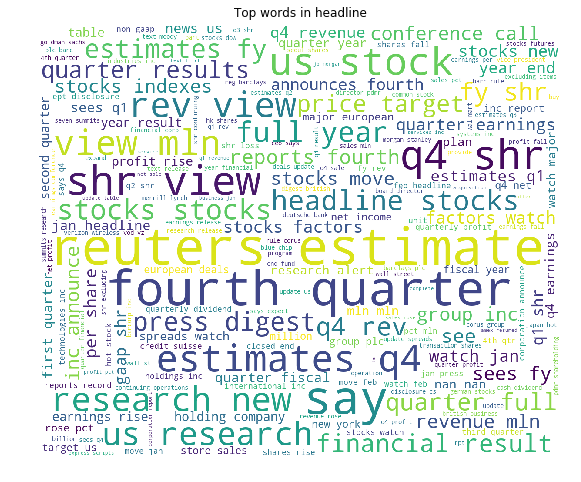

In [118]:
if ANALYTICS:
    text = ' '.join(news_train_df['headline'].astype('U').str.lower().values[:100000])
    wordcloud = WordCloud(max_font_size=None, stopwords=stop, background_color='white',
                          width=1200, height=1000).generate(text)
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud)
    plt.title('Top words in headline')
    plt.axis("off")
    plt.show()

Disproportionate urgency code:

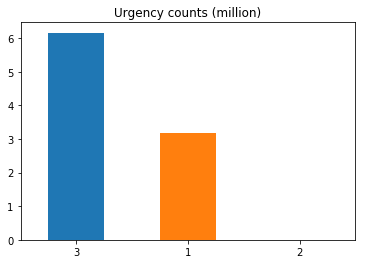

In [119]:
if ANALYTICS:
    (news_train_df['urgency'].value_counts() / 1000000).plot('bar');
    plt.xticks(rotation=0);
    plt.title('Urgency counts (million)');

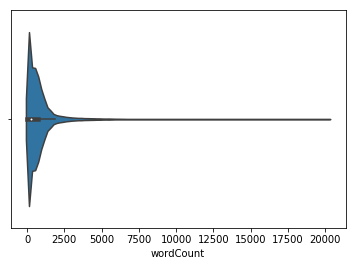

In [120]:
if ANALYTICS:
    sns.violinplot(x=news_train_df['wordCount'])

Most of the news articles have 2500 or less words.

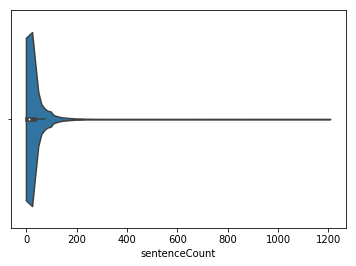

In [121]:
if ANALYTICS:
    sns.violinplot(x=news_train_df['sentenceCount'])

Most of the news articles have less than 100 sentences.

In [122]:
if ANALYTICS:
    news_train_df['provider'].value_counts().head(10)

It isn't surprising that Reuters is the largest news provider in this dataset.

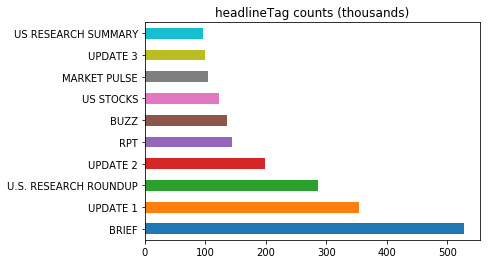

In [123]:
if ANALYTICS:
    (news_train_df['headlineTag'].value_counts() / 1000)[:10].plot('barh');
    plt.title('headlineTag counts (thousands)');

Most of the news articles don't have a headline tag.

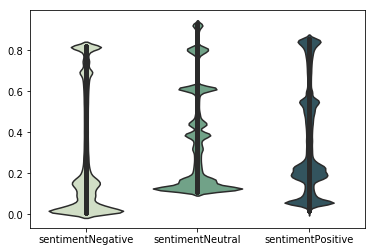

In [124]:
if ANALYTICS:
    pal = sns.cubehelix_palette(3, rot=-.5, dark=.3)
    sns.violinplot(data=news_train_df[['sentimentNegative', 'sentimentNeutral', 'sentimentPositive']], palette=pal, inner="points")

The sentiments are bipolar, with a large portion concentrated around neutrality and a small portion clustered around the apex.

In [125]:
if ANALYTICS:
    for i, j in zip([-1, 0, 1], ['negative', 'neutral', 'positive']):
        df_sentiment = news_train_df.loc[news_train_df['sentimentClass'] == i, 'assetName']
        print(f'Top mentioned companies for {j} sentiment are:')
        print(df_sentiment.value_counts().head(5))
        print('')

Top mentioned companies for negative sentiment are:
Citigroup Inc              30823
JPMorgan Chase & Co        29129
Bank of America Corp       28197
Apple Inc                  26702
Goldman Sachs Group Inc    25044
Name: assetName, dtype: int64

Top mentioned companies for neutral sentiment are:
Barclays PLC         24898
HSBC Holdings PLC    23191
Deutsche Bank AG     20702
BHP Billiton PLC     18019
Rio Tinto PLC        16782
Name: assetName, dtype: int64

Top mentioned companies for positive sentiment are:
Barclays PLC             22855
Apple Inc                22770
General Electric Co      20055
Royal Dutch Shell PLC    18206
Citigroup Inc            18025
Name: assetName, dtype: int64



We see that a number of companies such as Apple, Citigroup, Barclays show up in more than one sentiment class. It makes sense as these large companies get more attention from the press. From time to time, they could receive very different sentiments.

## Feature Engineering and Merge Data

The VM doesn't have enough memory. Temporarily shrinking the dataset. 

In [32]:
market_train_df = market_train_df.tail(3000000)
news_train_df = news_train_df.tail(6000000)

For market data, we extract more features from the original dataset directly. 

In [33]:
def extract_market_features(market_train_df):
    # downcast to reduce memory footprint
    market_train_df['volume'] = market_train_df['volume'].astype(np.float32)
    market_train_df['open'] = market_train_df['open'].astype(np.float32)
    market_train_df['close'] = market_train_df['close'].astype(np.float32)
    market_train_df['returnsClosePrevRaw1'] = market_train_df['returnsClosePrevRaw1'].astype(np.float32)
    market_train_df['returnsClosePrevRaw10'] = market_train_df['returnsClosePrevRaw10'].astype(np.float32)
    market_train_df['returnsClosePrevMktres1'] = market_train_df['returnsClosePrevMktres1'].astype(np.float32)
    market_train_df['returnsClosePrevMktres10'] = market_train_df['returnsClosePrevMktres10'].astype(np.float32)
    market_train_df['returnsOpenPrevRaw1'] = market_train_df['returnsOpenPrevRaw1'].astype(np.float32)
    market_train_df['returnsOpenPrevRaw10'] = market_train_df['returnsOpenPrevRaw10'].astype(np.float32)
    market_train_df['returnsOpenPrevMktres1'] = market_train_df['returnsOpenPrevMktres1'].astype(np.float32)
    market_train_df['returnsOpenPrevMktres10'] = market_train_df['returnsOpenPrevMktres10'].astype(np.float32)
    
    market_train_df['close_to_open'] = market_train_df['close'] / market_train_df['open']
    market_train_df['volume_to_mean'] = (market_train_df['volume'] / market_train_df['volume'].mean()).astype(np.float32)
    market_train_df['returns_close_to_open_prev_raw1'] = market_train_df['returnsClosePrevRaw1'] / market_train_df['returnsOpenPrevRaw1']
    market_train_df['returns_close_to_open_prev_raw10'] = market_train_df['returnsClosePrevRaw10'] / market_train_df['returnsOpenPrevRaw10']
    market_train_df['returns_close_to_open_prev_mktres1'] = market_train_df['returnsClosePrevMktres1'] / market_train_df['returnsOpenPrevMktres1']
    market_train_df['returns_close_to_open_prev_mktres10'] = market_train_df['returnsClosePrevMktres10'] / market_train_df['returnsOpenPrevMktres10']
    market_train_df['returns_prev_open_raw1_to_open_raw10'] = market_train_df['returnsOpenPrevRaw1'] / market_train_df['returnsOpenPrevRaw10']
    market_train_df['returns_prev_close_raw1_to_close_raw10'] = market_train_df['returnsClosePrevRaw1'] / market_train_df['returnsClosePrevRaw10']
    market_train_df['returns_prev_open_mktres1_to_open_mktres10'] = market_train_df['returnsOpenPrevMktres1'] / market_train_df['returnsOpenPrevMktres10']
    market_train_df['returns_prev_close_mktres1_to_close_mktres10'] = market_train_df['returnsClosePrevMktres1'] / market_train_df['returnsClosePrevMktres10']
    
    return market_train_df

* Convert "headline" from string to vector representation using TF-IDF.
* Create an one-hot representation of "subjects" simply by counting the top 20 subjects ordered by term frequency. 

In [34]:
def transform_headline(df, tfidf_vectorizer=None):
    if tfidf_vectorizer:
        headlines = tfidf_vectorizer.transform(df['headline']).toarray()
    else:
        tfidf_vectorizer = TfidfVectorizer(lowercase=True, stop_words='english', ngram_range=(1, 1), 
                                           min_df=10, max_features=20, dtype=np.float32)
        headlines = tfidf_vectorizer.fit_transform(df['headline'].values.astype('U')).toarray()
    
    for i in range(20):
        column_name = 'headline' + str(i+1)
        if (i < headlines.shape[1]):
            df[column_name] = headlines[:,i]
        else:
            df[column_name] = 0

    df.drop('headline', axis=1, inplace=True)
    
    return df, tfidf_vectorizer

def transform_subjects(df, cnt_vectorizer=None):
    if cnt_vectorizer:
        subjects = cnt_vectorizer.transform(df['subjects']).toarray()
    else:
        cnt_vectorizer = CountVectorizer(lowercase=True, ngram_range=(1, 1), min_df=10, 
                                         max_features=20, dtype=bool)
        subjects = cnt_vectorizer.fit_transform(df['subjects']).toarray()
    
    for i in range(20):
        column_name = 'subject' + str(i+1)
        if (i < subjects.shape[1]):
            df[column_name] = subjects[:,i]
        else:
            df[column_name] = 0
    
    df.drop('subjects', axis=1, inplace=True)
    
    return df, cnt_vectorizer

For news data, however, we may have multiple news articles associated with a stock on a given day. We collection a number of key statistics from these articles and aggregate them. 

In [35]:
def extract_news_features(news_train_df, tfidf_vectorizer=None, cnt_vectorizer=None):
    news_cols_agg = {
        'urgency': ['count'],
        'takeSequence': ['max'],
        'bodySize': ['mean', 'std'],
        'wordCount': ['mean', 'std'],
        'sentenceCount': ['mean', 'std'],
        'companyCount': ['mean', 'std'],
        'marketCommentary': ['mean'],
        'relevance': ['mean', 'std'],
        'sentimentNegative': ['min', 'max', 'mean', 'std'],
        'sentimentNeutral': ['min', 'max', 'mean', 'std'],
        'sentimentPositive': ['min', 'max', 'mean', 'std'],
        'sentimentWordCount': ['min', 'max', 'mean', 'std'],
        'noveltyCount12H': ['mean', 'std'],
        'noveltyCount24H': ['mean', 'std'],
        'noveltyCount3D': ['mean', 'std'],
        'noveltyCount5D': ['mean', 'std'],
        'noveltyCount7D': ['mean', 'std'],
        'volumeCounts12H': ['mean', 'std'],
        'volumeCounts24H': ['mean', 'std'],
        'volumeCounts3D': ['mean', 'std'],
        'volumeCounts5D': ['mean', 'std'],
        'volumeCounts7D': ['mean', 'std'],
        'headline1': ['mean'],
        'headline2': ['mean'],
        'headline3': ['mean'],
        'headline4': ['mean'],
        'headline5': ['mean'],
        'headline6': ['mean'],
        'headline7': ['mean'],
        'headline8': ['mean'],
        'headline9': ['mean'],
        'headline10': ['mean'],
        'headline11': ['mean'],
        'headline12': ['mean'],
        'headline13': ['mean'],
        'headline14': ['mean'],
        'headline15': ['mean'],
        'headline16': ['mean'],
        'headline17': ['mean'],
        'headline18': ['mean'],
        'headline19': ['mean'],
        'headline20': ['mean'],
        'subject1': ['mean'],
        'subject2': ['mean'],
        'subject3': ['mean'],
        'subject4': ['mean'],
        'subject5': ['mean'],
        'subject6': ['mean'],
        'subject7': ['mean'],
        'subject8': ['mean'],
        'subject9': ['mean'],
        'subject10': ['mean'],
        'subject11': ['mean'],
        'subject12': ['mean'],
        'subject13': ['mean'],
        'subject14': ['mean'],
        'subject15': ['mean'],
        'subject16': ['mean'],
        'subject17': ['mean'],
        'subject18': ['mean'],
        'subject19': ['mean'],
        'subject20': ['mean']
    }
    
    # text data -> vector representation
    news_train_df, tfidf_vectorizer = transform_headline(news_train_df, tfidf_vectorizer)
    news_train_df, cnt_vectorizer = transform_subjects(news_train_df, cnt_vectorizer)
    
    # Fix asset codes (str -> list)
    news_train_df['assetCodes'] = news_train_df['assetCodes'].str.findall(f"'([\w\./]+)'")    
    
    # Expand assetCodes
    assetCodes_expanded = list(chain(*news_train_df['assetCodes']))
    assetCodes_index = news_train_df.index.repeat( news_train_df['assetCodes'].apply(len) )

    assert len(assetCodes_index) == len(assetCodes_expanded)
    df_assetCodes = pd.DataFrame({'level_0': assetCodes_index, 'assetCode': assetCodes_expanded})

    # Create expandaded news (will repeat every assetCodes' row)
    news_cols = ['time', 'assetCodes'] + sorted(news_cols_agg.keys())
    news_train_df_expanded = pd.merge(df_assetCodes, news_train_df[news_cols], left_on='level_0', right_index=True, suffixes=(['','_old']))

    # Free memory
    del news_train_df, df_assetCodes

    # Aggregate numerical news features
    news_train_df_aggregated = news_train_df_expanded.groupby(['time', 'assetCode']).agg(news_cols_agg)
    
    # Free memory
    del news_train_df_expanded

    # Convert to float32 to save memory
    news_train_df_aggregated = news_train_df_aggregated.apply(np.float32)

    # Flat columns
    news_train_df_aggregated.columns = ['_'.join(col).strip() for col in news_train_df_aggregated.columns.values]
    
    return news_train_df_aggregated, tfidf_vectorizer, cnt_vectorizer

In [36]:
def merge_market_news(market_train_df, news_train_df):
    market_train_df = market_train_df.join(news_train_df, on=['time', 'assetCode'])
    
    return market_train_df

In [37]:
def label_encode(series, min_count):
    vc = series.value_counts()
    le = {c:i for i, c in enumerate(vc.index[vc >= min_count])}
    return le

def get_xy(market_train_df, news_train_df, le=None, tfidf_vectorizer=None, cnt_vectorizer=None):
    # Split date into before and after 22h (the time used in train data)
    # E.g: 2007-03-07 23:26:39+00:00 -> 2007-03-08 00:00:00+00:00 (next day)
    #      2009-02-25 21:00:50+00:00 -> 2009-02-25 00:00:00+00:00 (current day)
    news_train_df['time'] = (news_train_df['time'] - np.timedelta64(22,'h')).dt.ceil('1D')

    # Round time of market_train_df to 0h of curret day
    market_train_df['time'] = market_train_df['time'].dt.floor('1D')

    market_train_df = extract_market_features(market_train_df)
    news_train_df, tfidf_vectorizer, cnt_vectorizer = extract_news_features(news_train_df, 
                                                                            tfidf_vectorizer, 
                                                                            cnt_vectorizer)
    market_train_df = merge_market_news(market_train_df, news_train_df)

    # If not label-encoder... encode assetCode
    if le is None:
        le_assetCode = label_encode(market_train_df['assetCode'], min_count=10)
        le_assetName = label_encode(market_train_df['assetName'], min_count=5)
    else:
        # 'unpack' label encoders
        le_assetCode, le_assetName = le
        
    market_train_df['assetCode'] = market_train_df['assetCode'].map(le_assetCode).fillna(-1).astype(np.int16)
    market_train_df['assetName'] = market_train_df['assetName'].map(le_assetName).fillna(-1).astype(np.int16)
    market_train_df['dayofweek'] = market_train_df.time.dt.dayofweek.astype(np.int8)
    market_train_df['month'] = market_train_df.time.dt.month.astype(np.int8)
    
    try:
        y = market_train_df['returnsOpenNextMktres10'].astype(np.float32)
        market_train_df.drop(columns=['returnsOpenNextMktres10'], inplace=True)
    except:
        y = None
    
    try:
        time = market_train_df['time']
        market_train_df.drop(columns='time', inplace=True)
    except:
        time = None
    
    try:
        universe = market_train_df['universe']
        market_train_df.drop(columns=['universe'], inplace=True)
    except:
        universe = None
    
    return market_train_df, y, time, universe, (le_assetCode, le_assetName), tfidf_vectorizer, cnt_vectorizer

We then merge market data and news data, and remove the original dataframes to reduce memory footprint.

In [38]:
market_train_df, y, time, universe, le, tfidf_vectorizer, cnt_vectorizer = get_xy(market_train_df, news_train_df)

del news_train_df
gc.collect()

print(market_train_df.shape, y.shape)

(3000000, 115) (3000000,)


Determine what features to use for training and normalized training data: (No need to normalize data for tree based model)

In [39]:
feature_cols = market_train_df.columns.tolist()
# feature_cols = [c for c in X.columns if c not in ['time', 'universe', 'returnsOpenNextMktres10']]

# X = X[feature_cols]

# Normalize X values
# mins = np.nanmin(X[X != np.inf], axis=0)
# maxs = np.nanmax(X[X != np.inf], axis=0)
# rng = maxs - mins
# X = 1 - ((maxs - X) / rng)

In [40]:
market_train_df.describe()

,Unnamed: 0,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,...,subject13_mean,subject14_mean,subject15_mean,subject16_mean,subject17_mean,subject18_mean,subject19_mean,subject20_mean,dayofweek,month
count,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,2.989102e+06,2.989094e+06,...,749138.000000,749138.000000,749138.000000,749138.000000,749138.000000,749138.000000,749138.000000,749138.000000,3.000000e+06,3.000000e+06
mean,2.572956e+06,9.592328e+02,9.242142e+02,2.551214e+06,4.201493e+01,4.201011e+01,5.804256e-04,5.839471e-04,4.740993e-05,1.717419e-04,...,0.175416,0.340992,0.999924,0.163083,0.617475,0.262135,0.899527,0.193748,2.020557e+00,6.663946e+00
std,8.660255e+05,6.729093e+02,6.455006e+02,6.932740e+06,4.611606e+01,4.646582e+01,2.148449e-02,2.164497e-02,1.759757e-02,1.961888e-02,...,0.352930,0.432407,0.007832,0.329826,0.434852,0.406609,0.273753,0.357083,1.398418e+00,3.459489e+00
min,1.072956e+06,-1.000000e+00,-1.000000e+00,0.000000e+00,7.000000e-02,8.000000e-02,-1.000000e-01,-1.000000e-01,-1.000000e-01,-1.000000e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,1.000000e+00
25%,1.822956e+06,4.170000e+02,4.010000e+02,4.552430e+05,1.778000e+01,1.778000e+01,-9.587897e-03,-9.740259e-03,-7.771704e-03,-9.064435e-03,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000e+00,4.000000e+00
50%,2.572956e+06,8.400000e+02,8.210000e+02,9.635320e+05,3.181000e+01,3.180000e+01,4.649000e-04,5.576545e-04,-9.920185e-05,4.029858e-05,...,0.000000,0.000000,1.000000,0.000000,0.857143,0.000000,1.000000,0.000000,2.000000e+00,7.000000e+00
75%,3.322955e+06,1.385000e+03,1.339000e+03,2.338315e+06,5.270000e+01,5.268000e+01,1.066351e-02,1.084645e-02,7.614951e-03,9.140035e-03,...,0.037037,1.000000,1.000000,0.000000,1.000000,0.500000,1.000000,0.200000,3.000000e+00,1.000000e+01
max,4.072955e+06,3.250000e+03,3.124000e+03,1.226791e+09,1.578130e+03,9.998990e+03,1.000000e-01,1.000000e-01,1.000000e-01,1.000000e-01,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000e+00,1.200000e+01


Create training and validation datasets and add time and universe to validation dataset in order to calculate custom scores later. 

## Modeling

In [42]:
train_index, test_index = train_test_split(market_train_df.index, test_size=0.1, random_state=2018)
train_index, valid_index = train_test_split(train_index, test_size=0.2, random_state=2018)

**CatBoost Classifier**

In [59]:
up = y >= 0
day = time.dt.date

In [61]:
cat_model = CatBoostClassifier(thread_count=4, n_estimators=200, max_depth=10, 
                               eta=0.1, loss_function='Logloss' , verbose=20)
cat_model.fit(market_train_df.loc[train_index], up.loc[train_index])

0:	learn: 0.6915571	total: 5.33s	remaining: 17m 40s
10:	learn: 0.6842325	total: 57.7s	remaining: 16m 32s
20:	learn: 0.6812397	total: 1m 45s	remaining: 14m 59s
30:	learn: 0.6791593	total: 2m 30s	remaining: 13m 42s
40:	learn: 0.6777229	total: 3m 15s	remaining: 12m 37s
50:	learn: 0.6762891	total: 4m 1s	remaining: 11m 45s
60:	learn: 0.6749791	total: 4m 47s	remaining: 10m 54s
70:	learn: 0.6738321	total: 5m 30s	remaining: 9m 59s
80:	learn: 0.6726627	total: 6m 15s	remaining: 9m 11s
90:	learn: 0.6716701	total: 7m 2s	remaining: 8m 26s
100:	learn: 0.6706146	total: 7m 48s	remaining: 7m 39s
110:	learn: 0.6696128	total: 8m 34s	remaining: 6m 52s
120:	learn: 0.6687799	total: 9m 18s	remaining: 6m 4s
130:	learn: 0.6679313	total: 10m 1s	remaining: 5m 17s
140:	learn: 0.6669678	total: 10m 47s	remaining: 4m 30s
150:	learn: 0.6661485	total: 11m 32s	remaining: 3m 44s
160:	learn: 0.6653634	total: 12m 18s	remaining: 2m 58s
170:	learn: 0.6646992	total: 13m 2s	remaining: 2m 12s
180:	learn: 0.6639173	total: 13m 4

0.5926148148148148


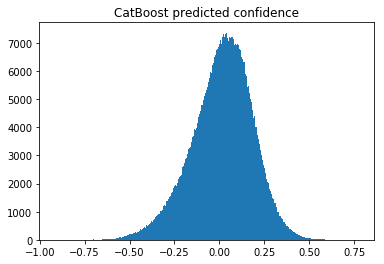

In [62]:
from sklearn.metrics import accuracy_score
catconfidence_valid = cat_model.predict_proba(market_train_df.loc[valid_index])[:,1]*2 -1

print(accuracy_score(catconfidence_valid > 0, up.loc[valid_index]))
plt.hist(catconfidence_valid, bins='auto')
plt.title("CatBoost predicted confidence")
plt.show()

In [63]:
x_t_icat = catconfidence_valid * y.loc[valid_index] * universe.loc[valid_index]
data2 = {'day' : time.loc[valid_index].dt.date, 'x_t_icat' : x_t_icat}
df2 = pd.DataFrame(data2)
x_tcat = df2.groupby('day').sum().values.flatten()
mean = np.mean(x_tcat)
std = np.std(x_tcat)
score_testcat = mean / std
print(f'CatBoost score: {score_testcat}')

CatBoost score: 0.8817461741078361


**LightGBM Regressor**

Use LightGBM to build a regression model:

In [43]:
def score_function(preds, valid_data):
    time = valid_data.params['time']
    universe = valid_data.params['universe']
    labels = valid_data.get_label()

    x_t = preds * labels * universe
    x_t_sum = x_t.groupby(time).sum()
    score = x_t_sum.mean() / x_t_sum.std()
    
    return 'score', score, True

def evaluate_model(X, y, train_index, test_index, params):
    data_train = lgb.Dataset(X.loc[train_index].values, y.loc[train_index], feature_name=feature_cols, free_raw_data=False)
    data_test = lgb.Dataset(X.loc[test_index].values, y.loc[test_index], feature_name=feature_cols, free_raw_data=False)
    data_test.params = {
        'time': time.loc[test_index].factorize()[0],
        'universe': universe.loc[test_index].values
    }
    evals_result = {}
    
    model = lgb.train(params, train_set=data_train, num_boost_round=2000,
                      valid_sets=(data_test,), valid_names=('valid',),
                      verbose_eval=50, early_stopping_rounds=100,
                      feval=score_function, evals_result=evals_result)

    df_result = pd.DataFrame(evals_result['valid'])
    
    return df_result, model

#### Hyperparameter tuning

In [44]:
def run_bayesian_optimization():
    # optimize params in these ranges
    spaces = [
        (0.05, 0.22), #learning_rate
        (800, 2000), #num_leaves
        (500, 3000), #min_data_in_leaf
        (6, 15), # max_depth
        (0.5, 1.0), # bagging_fraction
        (1, 5), # bagging_freq
        (0.5, 1.0), # feature_fraction
        (200, 800), #max_bin
        (0.3, 0.9), # lambda_l1
        (0.3, 0.9) # lambda_l2
    ]

    def f(x):
        lgb_param = {
            'boosting': 'gbdt', 
            'objective': 'regression_l1',
            'metric': 'None',
            'learning_rate': x[0],
            'num_leaves': x[1],
            'min_data_in_leaf': x[2],
            'max_depth': x[3],
            'bagging_fraction': x[4],
            'bagging_freq': x[5],
            'feature_fraction': x[6],
            'max_bin': x[7],
            'lambda_l1': x[8],
            'lambda_l2': x[9],
            'seed': 2018
        }

        df_result, model = evaluate_model(market_train_df, y, train_index,test_index, lgb_param)

        return -df_result['score'].values[-1]

    # run optimization
    from skopt import gp_minimize
    res = gp_minimize(
        f, spaces,
        acq_func="EI",
        n_calls=15)

    # print tuned params
    print(res.x)

    # plot tuning process
    from skopt.plots import plot_convergence
    plot_convergence(res)

In [58]:
# run_bayesian_optimization() # This takes a long time to run. Optimal parameters are shown below. 

In [45]:
lgb_params = {
    'boosting': 'gbdt', 
    'objective': 'regression_l1',
    'metric': 'None',
    'learning_rate': 0.22,
    'num_leaves': 2000,
    'min_data_in_leaf': 500,
    'max_depth': 15,
    'bagging_fraction': 1.0,
    'bagging_freq': 1,
    'feature_fraction': 1.0,
    'max_bin': 200,
    'lambda_l1': 0.30,
    'lambda_l2': 0.90,
    'seed': 2018
}

In [46]:
df_result, model = evaluate_model(market_train_df, y, train_index, test_index, lgb_params)

Training until validation scores don't improve for 100 rounds.
[50]	test's score: 0.792413
[100]	test's score: 0.81864
[150]	test's score: 0.825216
[200]	test's score: 0.83105
[250]	test's score: 0.833977
[300]	test's score: 0.838779
[350]	test's score: 0.844473
[400]	test's score: 0.84535
[450]	test's score: 0.847778
[500]	test's score: 0.852315
[550]	test's score: 0.854786
[600]	test's score: 0.855781
[650]	test's score: 0.856842
[700]	test's score: 0.860084
[750]	test's score: 0.865067
[800]	test's score: 0.866007
[850]	test's score: 0.866627
[900]	test's score: 0.867803
[950]	test's score: 0.868272
[1000]	test's score: 0.869034
[1050]	test's score: 0.872868
[1100]	test's score: 0.87484
[1150]	test's score: 0.87543
[1200]	test's score: 0.876361
[1250]	test's score: 0.878142
[1300]	test's score: 0.878428
[1350]	test's score: 0.880674
[1400]	test's score: 0.882063
[1450]	test's score: 0.882935
[1500]	test's score: 0.882169
Early stopping, best iteration is:
[1431]	test's score: 0.8830

Text(0,0.5,'score')

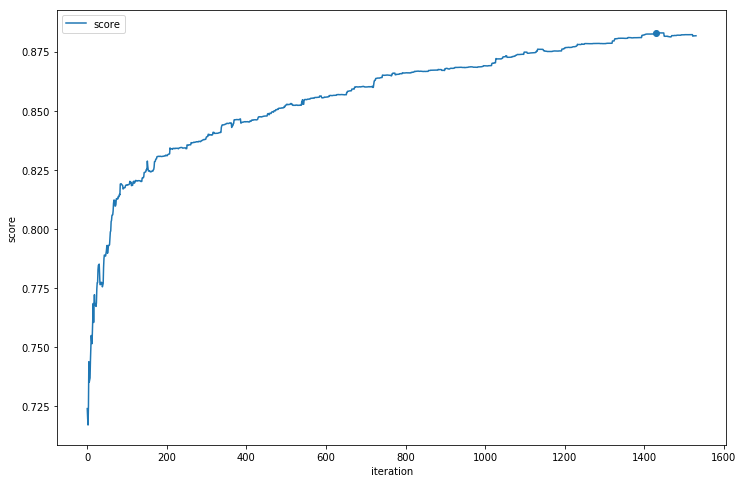

In [47]:
ax = df_result.plot(figsize=(12, 8))
ax.scatter(df_result['score'].idxmax(), df_result['score'].max())
ax.set_xlabel("iteration")
ax.set_ylabel("score")

In [48]:
num_boost_round, valid_score = df_result['score'].idxmax()+1, df_result['score'].max()
print(lgb_params)
print(f'Best score was {valid_score:.5f} on round {num_boost_round}')

{'boosting': 'gbdt', 'objective': 'regression_l1', 'metric': 'None', 'learning_rate': 0.22, 'num_leaves': 2000, 'min_data_in_leaf': 500, 'max_depth': 15, 'bagging_fraction': 1.0, 'bagging_freq': 1, 'feature_fraction': 1.0, 'max_bin': 200, 'lambda_l1': 0.3, 'lambda_l2': 0.9, 'seed': 2018}
Best score was 0.88306 on round 1431


We will use this optimized hyperparameter to train the full model later. 

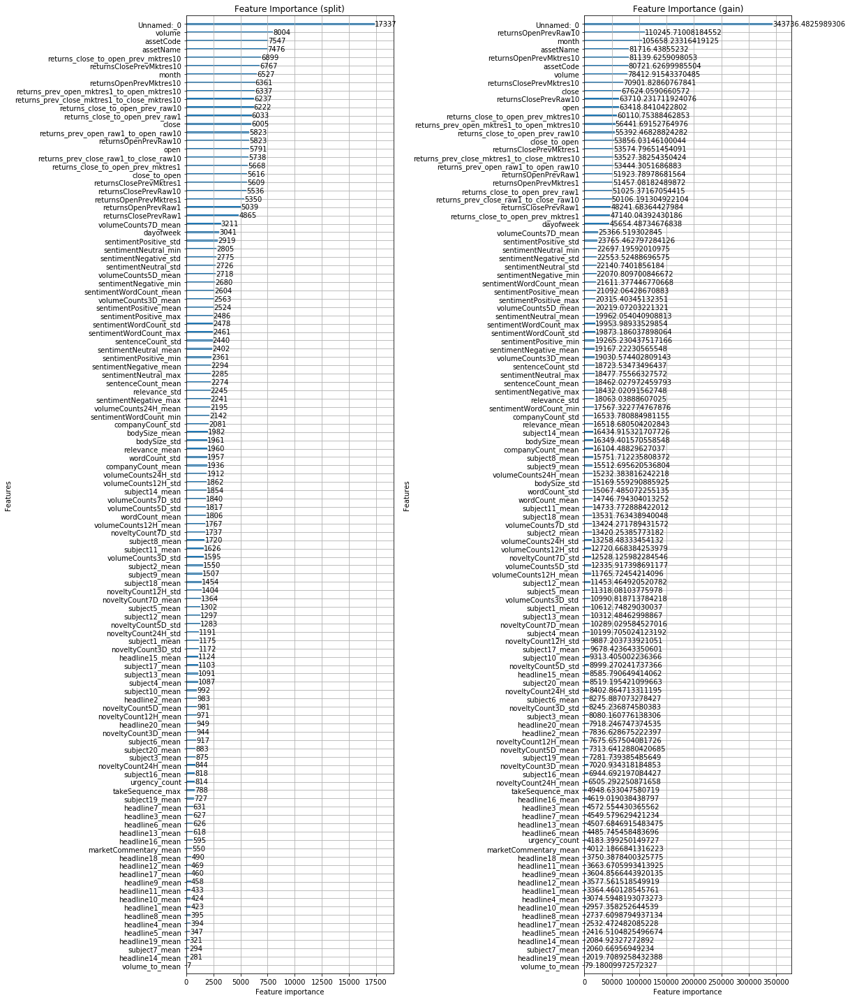

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(16, 20))
lgb.plot_importance(model, ax=ax[0], title='Feature Importance (split)', xlabel='Feature importance', ylabel='Features',
                    importance_type='split', max_num_features=114)
lgb.plot_importance(model, ax=ax[1], title='Feature Importance (gain)', xlabel='Feature importance', ylabel='Features',
                    importance_type='gain', max_num_features=114)
fig.tight_layout()

## Prediction

In [52]:
full_index = train_index.union(valid_index)

In [53]:
def evaluate(preds, labels, universe, time):
    x_t = preds * labels * universe
    x_t_sum = x_t.groupby(time).sum()
    score = x_t_sum.mean() / x_t_sum.std()
    
    return score

#### Benchmark

In [126]:
benchPrediction = np.ones((y.loc[test_index].shape))
print('The benchmark\'s score on test data: ', evaluate(benchPrediction, y.loc[test_index], 
                                                        universe.loc[test_index], time.loc[test_index]))

The benchmark's score on test data:  0.015981435398706775


#### Cat Boost Classifier

In [64]:
catModel = CatBoostClassifier(thread_count=4, n_estimators=200, max_depth=10, eta=0.1, 
                              loss_function='Logloss', verbose=20)
catModel.fit(market_train_df.loc[full_index], up.loc[full_index])

0:	learn: 0.6915516	total: 6.39s	remaining: 21m 11s
1:	learn: 0.6902679	total: 13.6s	remaining: 22m 22s
2:	learn: 0.6892034	total: 20.2s	remaining: 22m 5s
3:	learn: 0.6883093	total: 26.9s	remaining: 21m 56s
4:	learn: 0.6874884	total: 33.2s	remaining: 21m 33s
5:	learn: 0.6867796	total: 40.2s	remaining: 21m 39s
6:	learn: 0.6861281	total: 46.4s	remaining: 21m 20s
7:	learn: 0.6855670	total: 52.9s	remaining: 21m 10s
8:	learn: 0.6849942	total: 59.6s	remaining: 21m 5s
9:	learn: 0.6844827	total: 1m 5s	remaining: 20m 47s
10:	learn: 0.6840203	total: 1m 11s	remaining: 20m 36s
11:	learn: 0.6836225	total: 1m 18s	remaining: 20m 22s
12:	learn: 0.6831867	total: 1m 24s	remaining: 20m 18s
13:	learn: 0.6829081	total: 1m 31s	remaining: 20m 14s
14:	learn: 0.6825630	total: 1m 37s	remaining: 20m 1s
15:	learn: 0.6823199	total: 1m 43s	remaining: 19m 51s
16:	learn: 0.6821010	total: 1m 49s	remaining: 19m 34s
17:	learn: 0.6817651	total: 1m 55s	remaining: 19m 29s
18:	learn: 0.6815073	total: 2m 1s	remaining: 19m 17

153:	learn: 0.6662391	total: 14m 27s	remaining: 4m 19s
154:	learn: 0.6661734	total: 14m 33s	remaining: 4m 13s
155:	learn: 0.6661133	total: 14m 37s	remaining: 4m 7s
156:	learn: 0.6660346	total: 14m 42s	remaining: 4m 1s
157:	learn: 0.6659639	total: 14m 48s	remaining: 3m 56s
158:	learn: 0.6658949	total: 14m 53s	remaining: 3m 50s
159:	learn: 0.6657773	total: 14m 59s	remaining: 3m 44s
160:	learn: 0.6657151	total: 15m 4s	remaining: 3m 39s
161:	learn: 0.6656566	total: 15m 10s	remaining: 3m 33s
162:	learn: 0.6655801	total: 15m 15s	remaining: 3m 27s
163:	learn: 0.6655348	total: 15m 20s	remaining: 3m 22s
164:	learn: 0.6654852	total: 15m 25s	remaining: 3m 16s
165:	learn: 0.6654154	total: 15m 30s	remaining: 3m 10s
166:	learn: 0.6653585	total: 15m 36s	remaining: 3m 5s
167:	learn: 0.6652972	total: 15m 42s	remaining: 2m 59s
168:	learn: 0.6652386	total: 15m 47s	remaining: 2m 53s
169:	learn: 0.6652027	total: 15m 53s	remaining: 2m 48s
170:	learn: 0.6651142	total: 15m 59s	remaining: 2m 42s
171:	learn: 0.

In [65]:
catPrediction = np.clip(catModel.predict_proba(market_train_df.loc[test_index])[:,1]*2 -1, -1, 1)
print('CatBoostClassifier\'s score on test data: ', evaluate(catPrediction, y.loc[test_index], 
                                                             universe.loc[test_index], time.loc[test_index]))

CatBoostClassifier's score on test data:  0.84963206287695


**LightGBM Regressor**

In [56]:
data_train_full = lgb.Dataset(market_train_df.loc[full_index].values, y.loc[full_index], 
                              feature_name=feature_cols, free_raw_data=False)
lightModel = lgb.train(lgb_params, train_set=data_train_full, num_boost_round=num_boost_round)

In [57]:
lightPrediction = np.clip(lightModel.predict(market_train_df.loc[test_index]), -1, 1)
print('LightGBMRegressor\'s score on test data: ', evaluate(lightPrediction, y.loc[test_index], 
                                                            universe.loc[test_index], time.loc[test_index]))

LightGBMRegressor's score on test data:  0.9156713305640285
